# Detect All Letters Using Detectron

We detect all 6 letters we have annotations for using the Detectron library, specificly, the Faster_r-cnn_50 model.


Imports & global config

In [1]:
# Cell: imports & configuration

from pathlib import Path
import os
import json
import random
import shutil

import cv2
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image

from detectron2.utils.logger import setup_logger
setup_logger()

from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2.utils.visualizer import Visualizer, ColorMode

import torch
from detectron2.data import detection_utils as utils
from detectron2.data import build_detection_train_loader
from detectron2.data import transforms as T

# ---------------- Dataset infra (matching prepare_dataset & original notebook) ----------------

DATA_ROOT = Path("ASC_dataset2")

# Per-letter COCO annotations (one JSON per category_id)
ANNOT_ROOT = DATA_ROOT / "per_letter"
TRAIN_JSON_TEMPLATE = ANNOT_ROOT / "train_cat_{category_id}.json"
VAL_JSON_TEMPLATE   = ANNOT_ROOT / "val_cat_{category_id}.json"

TRAIN_IMAGES_ROOT = DATA_ROOT / "images_detectron" / "train"
VAL_IMAGES_ROOT   = DATA_ROOT / "images_detectron" / "val"

# Full manuscript images (for inference / final predictions)
INFER_IMAGES_ROOT = Path("images")   # images/french, images/german
SCRIPT_MODES = ["french", "german"]

# ---------------- Letters & category IDs ----------------
# category_id here is the COCO category ID used in your per-letter JSONs.
LETTERS = [
    {"category_id": 1, "letter_name": "Aleph"},
    {"category_id": 2, "letter_name": "He"},
    {"category_id": 3, "letter_name": "Mem"},
    {"category_id": 4, "letter_name": "Shin"},
    {"category_id": 5, "letter_name": "Mem Sofit"},
    {"category_id": 6, "letter_name": "Tav"},
]

# ---------------- Training hyperparameters ----------------

BASE_CONFIG = "COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"
BASE_LR = 0.00025
MAX_ITER = 15000           # adapt if you prefer epoch-based logic
IMS_PER_BATCH = 1
BATCH_SIZE_PER_IMAGE = 512
NUM_WORKERS = 2
SCORE_THRESH_TEST = 0.8
NUM_FC = 2

# Where to store all letter-specific runs
DETECTRON_RUNS_ROOT = Path("detectron_letter_runs")
DETECTRON_RUNS_ROOT.mkdir(exist_ok=True)

Helper: filename → image_id

Using the convention:

image_id = 100·x + 10·y + z, where filename is x_y_z.ext
with x and y 3-digit, z 2-digit.

In [2]:
# Cell: helper to compute COCO image_id from filename

def image_id_from_filename(path: Path) -> int:
    """
    Given path with stem 'x_y_z' where:
      x: 3-digit int
      y: 3-digit int
      z: 2-digit int
    returns image_id = 100*x + 10*y + z
    """
    name = path.stem
    parts = name.split("_")
    if len(parts) != 3:
        raise ValueError(f"Unexpected filename format for image_id: {path.name}")

    try:
        x = int(parts[0])
        y = int(parts[1])
        z = int(parts[2])
    except ValueError:
        raise ValueError(f"Cannot parse x_y_z from filename: {path.name}")

    return 100 * x + 10 * y + z

Move the train and val images to a flat directory for each split so Detectron can consume more easily

In [3]:

for split in ["train", "val"]:
    split_root = DATA_ROOT / "images" / split
    dist_root = DATA_ROOT / "images_detectron" / split
    os.makedirs(dist_root, exist_ok=True)
    for subdir in ["french", "german"]:
        sub_path = split_root / subdir
        if not sub_path.exists():
            continue
        for img_path in sub_path.rglob("*"):
            if not img_path.is_file():
                continue
            if img_path.suffix.lower() not in [".jpg", ".jpeg", ".png", ".tif", ".tiff"]:
                continue

            dest = dist_root / img_path.name
            if dest.exists():
                print(f"WARNING: {dest} already exists, skipping {img_path}")
                continue
            shutil.copy(str(img_path), str(dest))



Letter-specific dataset registration

In [4]:
# Cell: register per-letter train/val datasets in Detectron2

def register_letter_datasets(letter_name: str, category_id: int):
    """
    Register:
      dss_train_{letter_name}
      dss_val_{letter_name}
    """
    train_name = f"dss_train_{letter_name}"
    val_name   = f"dss_val_{letter_name}"

    if train_name not in DatasetCatalog.list():
        register_coco_instances(
            train_name,
            {},
            str(TRAIN_JSON_TEMPLATE).format(category_id=category_id),
            str(TRAIN_IMAGES_ROOT),
        )
    if val_name not in DatasetCatalog.list():
        register_coco_instances(
            val_name,
            {},
            str(VAL_JSON_TEMPLATE).format(category_id=category_id),
            str(VAL_IMAGES_ROOT),
        )

    # NOTE: per-letter datasets typically have a single category (the letter),
    # so we override thing_classes to [letter_name]
    MetadataCatalog.get(train_name).thing_classes = [letter_name]
    MetadataCatalog.get(val_name).thing_classes   = [letter_name]

    return train_name, val_name

# Quick sanity print (just to see what gets registered)
for L in LETTERS:
    tn, vn = register_letter_datasets(L["letter_name"], L["category_id"])
    print(f"Registered: {tn}, {vn}")

Registered: dss_train_Aleph, dss_val_Aleph
Registered: dss_train_He, dss_val_He
Registered: dss_train_Mem, dss_val_Mem
Registered: dss_train_Shin, dss_val_Shin
Registered: dss_train_Mem Sofit, dss_val_Mem Sofit
Registered: dss_train_Tav, dss_val_Tav


Build config for one letter (single-class model)

In [5]:
# Cell: build Detectron2 config for a single letter

def build_cfg_for_letter(letter_name: str, output_dir: Path):
    cfg = get_cfg()
    cfg.merge_from_file(model_zoo.get_config_file(BASE_CONFIG))

    # Single-letter datasets
    cfg.DATASETS.TRAIN = (f"dss_train_{letter_name}",)
    cfg.DATASETS.TEST  = (f"dss_val_{letter_name}",)

    cfg.DATALOADER.NUM_WORKERS = NUM_WORKERS

    # Pretrained COCO weights
    cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(BASE_CONFIG)

    # Single class (this letter only)
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

    # ROI Box Head Configurations
    # cfg.MODEL.ROI_BOX_HEAD.POOLER_RESOLUTION = 7
    cfg.MODEL.ROI_BOX_HEAD.NUM_FC = NUM_FC  # Number of fully connected layers

    cfg.MODEL.RPN.PRE_NMS_TOPK_TRAIN = 4000
    cfg.MODEL.RPN.PRE_NMS_TOPK_TEST = 2000
    cfg.MODEL.RPN.POST_NMS_TOPK_TRAIN = 1000
    cfg.MODEL.RPN.POST_NMS_TOPK_TEST = 1000

    # Solver settings
    cfg.SOLVER.IMS_PER_BATCH = IMS_PER_BATCH
    cfg.SOLVER.BASE_LR = BASE_LR
    cfg.SOLVER.MAX_ITER = MAX_ITER
    cfg.SOLVER.STEPS = []  # no LR decay schedule for simplicity

    cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = BATCH_SIZE_PER_IMAGE
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = SCORE_THRESH_TEST

    cfg.OUTPUT_DIR = str(output_dir)
    os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

    return cfg

Custom Trainer

In [6]:
# Cell: custom Trainer that uses the manuscript mapper

from detectron2.engine import DefaultTrainer
from detectron2.data import DatasetMapper 

class HebrewManuscriptTrainer(DefaultTrainer):

    @classmethod
    def build_train_loader(cls, cfg):
        mapper = DatasetMapper(cfg, is_train=True, augmentations=[T.RandomBrightness(0.8, 1.2), T.ResizeShortestEdge(short_edge_length=800, max_size=1333), T.RandomContrast(0.8, 1.2)])
        return build_detection_train_loader(cfg, mapper=mapper)

Train & validate one letter

This wraps training + COCO evaluation in a function so we can loop over letters.

In [7]:
# Cell: train & evaluate a single-letter model

def train_and_eval_letter(letter_name: str, category_id: int):
    run_dir = DETECTRON_RUNS_ROOT / f"{category_id:02d}_{letter_name}"
    cfg = build_cfg_for_letter(letter_name, run_dir)

    print("=" * 80)
    print(f"Training Detectron2 model for letter: {letter_name} (category_id={category_id})")
    print(f"Output dir: {run_dir}")
    print("=" * 80)

    trainer = HebrewManuscriptTrainer(cfg)
    trainer.resume_or_load(resume=False)
    trainer.train()

    # --- evaluation on val split ---
    evaluator = COCOEvaluator(f"dss_val_{letter_name}", cfg, False, output_dir=str(run_dir / "eval"))
    val_loader = build_detection_test_loader(cfg, f"dss_val_{letter_name}")
    results = inference_on_dataset(trainer.model, val_loader, evaluator)

    print(f"Validation results for {letter_name}:")
    print(results)

    # Build a predictor using final weights for later inference
    cfg_infer = cfg.clone()
    cfg_infer.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
    predictor = DefaultPredictor(cfg_infer)

    return {
        "cfg": cfg,
        "run_dir": run_dir,
        "results": results,
        "predictor": predictor,
    }

Helper: export COCO predictions for one letter & one script mode


In [8]:
# Cell: export Detectron predictions for ONE letter + ONE script as COCO

def export_detectron_predictions_for_letter_and_script(
    letter_name: str,
    category_id: int,
    predictor: DefaultPredictor,
    script_mode: str,
    images_root: Path = INFER_IMAGES_ROOT,
    score_thresh: float = SCORE_THRESH_TEST,
):
    """
    Run a trained single-letter Detectron2 model on all images under images_root/script_mode
    and export predictions in COCO format with filename:
        detectron_preds/detectron_preds_cat{category_id}_{script_mode}.json

    image_id is computed as 100*x + 10*y + z for x_y_z.ext.
    """

    script_dir = images_root / script_mode
    image_paths = sorted(
        [
            p
            for p in script_dir.rglob("*")
            if p.suffix.lower() in [".jpg", ".jpeg", ".png", ".tif", ".tiff"]
        ]
    )

    print(f"\n[{letter_name}] {script_mode}: found {len(image_paths)} images under {script_dir}")

    images = []
    annotations = []
    categories = [
        {
            "id": category_id,     # COCO category id for this letter
            "name": letter_name,
            "supercategory": "letter",
        }
    ]

    ann_id = 1
    seen_image_ids = set()

    for img_path in tqdm(image_paths, desc=f"{letter_name} – {script_mode}"):
        try:
            image_id = image_id_from_filename(img_path)
        except ValueError as e:
            print(f"Skipping {img_path}: {e}")
            continue

        img = cv2.imread(str(img_path))
        if img is None:
            print(f"Skipping {img_path}: could not read.")
            continue

        height, width = img.shape[:2]

        if image_id not in seen_image_ids:
            images.append(
                {
                    "id": image_id,
                    "file_name": str(img_path.relative_to(images_root)),
                    "width": width,
                    "height": height,
                }
            )
            seen_image_ids.add(image_id)

        outputs = predictor(img)
        instances = outputs["instances"].to("cpu")

        pred_boxes = instances.pred_boxes.tensor.numpy()
        scores = instances.scores.numpy()
        pred_classes = instances.pred_classes.numpy()  # Only class 0 in this single-letter model

        for box, score, cls in zip(pred_boxes, scores, pred_classes):
            # predictor is trained with NUM_CLASSES = 1
            if int(cls) != 0:
                continue
            if score < score_thresh:
                continue

            x1, y1, x2, y2 = box.tolist()
            w = x2 - x1
            h = y2 - y1
            if w <= 0 or h <= 0:
                continue

            annotations.append(
                {
                    "id": ann_id,
                    "image_id": image_id,
                    "category_id": category_id,  # map to global COCO id
                    "bbox": [int(x1), int(y1), int(w), int(h)],
                    "area": int(w * h),
                    "iscrowd": 0,
                    "score": float(score),
                }
            )
            ann_id += 1

    out_dir = Path("detectron_preds")
    out_dir.mkdir(parents=True, exist_ok=True)
    out_json = out_dir / f"detectron_preds_cat{category_id}_{script_mode}.json"

    coco_dict = {
        "images": images,
        "annotations": annotations,
        "categories": categories,
    }

    with open(out_json, "w", encoding="utf-8") as f:
        json.dump(coco_dict, f, indent=4)

    print(
        f"Saved {len(annotations)} predictions for {len(images)} images "
        f"({script_mode}, {letter_name}, category_id={category_id}) -> {out_json}"
    )

qualitative visualizations per letter

You might want a couple of “nice pages with boxes” for each letter.

In [9]:
# Cell: optional qualitative visualization per letter

def visualize_predictions_for_letter(letter_name: str, predictor: DefaultPredictor, script_mode: str, n=3):
    script_dir = INFER_IMAGES_ROOT / script_mode
    image_paths = sorted(
        [
            p
            for p in script_dir.rglob("*")
            if p.suffix.lower() in [".jpg", ".jpeg", ".png", ".tif", ".tiff"]
        ]
    )
    if not image_paths:
        print(f"No images found under {script_dir}")
        return

    sampled = random.sample(image_paths, min(n, len(image_paths)))

    # For visualization purposes, pretend there is one class with name=letter_name
    meta = MetadataCatalog.get(f"dss_val_{letter_name}")
    for img_path in sampled:
        img_bgr = cv2.imread(str(img_path))
        img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)

        outputs = predictor(img_bgr)
        v = Visualizer(img_rgb, metadata=meta, scale=0.8, instance_mode=ColorMode.IMAGE)
        out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        plt.figure(figsize=(10, 10))
        plt.title(f"{letter_name} – {script_mode}: {img_path.name}")
        plt.imshow(out.get_image())
        plt.axis("off")
        plt.show()

Main loop: all letters, one at a time

This is where we actually: train, evaluate, then export COCO predictions per letter.

Training Detectron2 model for letter: Aleph (category_id=1)
Output dir: detectron_letter_runs/01_Aleph
[11/24 23:01:46 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), 

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[11/24 23:01:46 d2.engine.train_loop]: Starting training from iteration 0


/home/suliman/miniconda3/envs/measure_ratios/lib/python3.12/site-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /opt/conda/conda-bld/pytorch_1729647378361/work/aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/24 23:01:52 d2.utils.events]:  eta: 0:40:12  iter: 19  total_loss: 3.964  loss_cls: 0.7168  loss_box_reg: 0.2393  loss_rpn_cls: 2.798  loss_rpn_loc: 0.2155    time: 0.1977  last_time: 0.2771  data_time: 0.0857  last_data_time: 0.2214   lr: 4.9953e-06  max_mem: 1559M
[11/24 23:01:55 d2.utils.events]:  eta: 0:39:02  iter: 39  total_loss: 2.129  loss_cls: 0.6394  loss_box_reg: 0.3659  loss_rpn_cls: 0.9174  loss_rpn_loc: 0.1992    time: 0.1926  last_time: 0.1509  data_time: 0.1161  last_data_time: 0.0970   lr: 9.9902e-06  max_mem: 1724M
[11/24 23:02:00 d2.utils.events]:  eta: 0:32:53  iter: 59  total_loss: 1.537  loss_cls: 0.5864  loss_box_reg: 0.527  loss_rpn_cls: 0.2798  loss_rpn_loc: 0.1829    time: 0.2045  last_time: 0.0574  data_time: 0.1628  last_data_time: 0.0020   lr: 1.4985e-05  max_mem: 1724M
[11/24 23:02:03 d2.utils.events]:  eta: 0:23:16  iter: 79  total_loss: 1.386  loss_cls: 0.5551  loss_box_reg: 0.5433  loss_rpn_cls: 0.2022  loss_rpn_loc: 0.1279    time: 0.1967  last_tim

/home/suliman/miniconda3/envs/measure_ratios/lib/python3.12/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f,


[Aleph] french: found 144 images under images/french


Aleph – french: 100%|██████████| 144/144 [00:27<00:00,  5.28it/s]


Saved 5560 predictions for 144 images (french, Aleph, category_id=1) -> detectron_preds/detectron_preds_cat1_french.json

[Aleph] german: found 156 images under images/german


Aleph – german: 100%|██████████| 156/156 [00:30<00:00,  5.07it/s]


Saved 6075 predictions for 156 images (german, Aleph, category_id=1) -> detectron_preds/detectron_preds_cat1_german.json


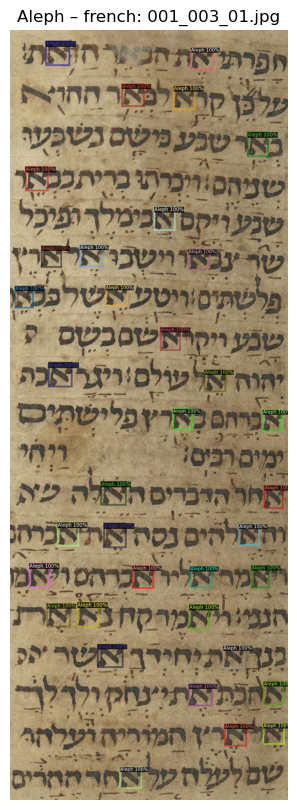

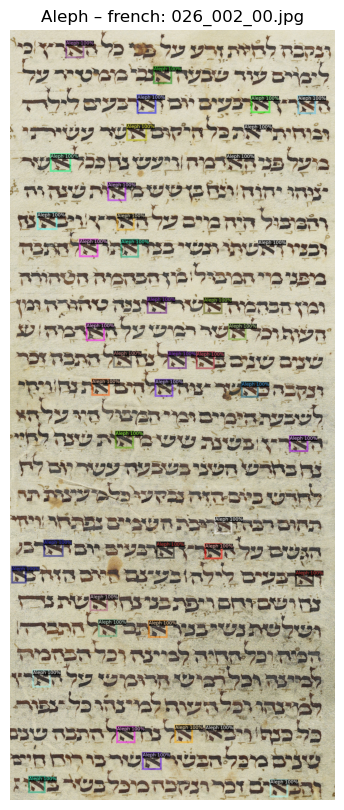

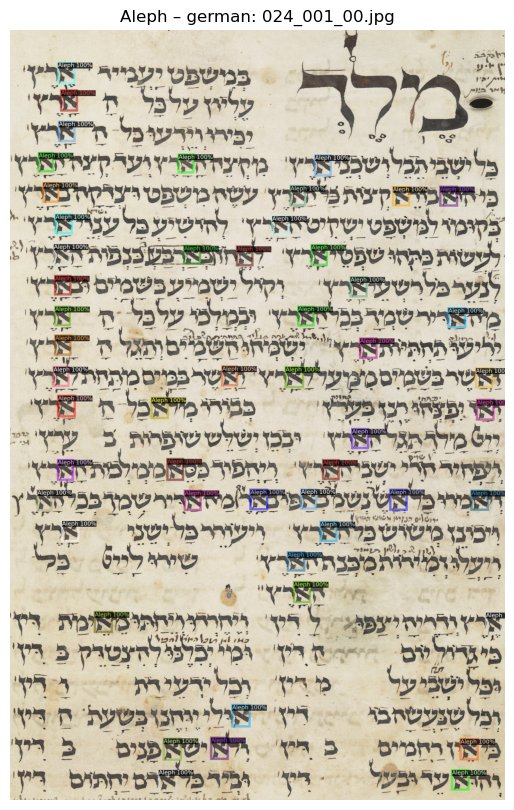

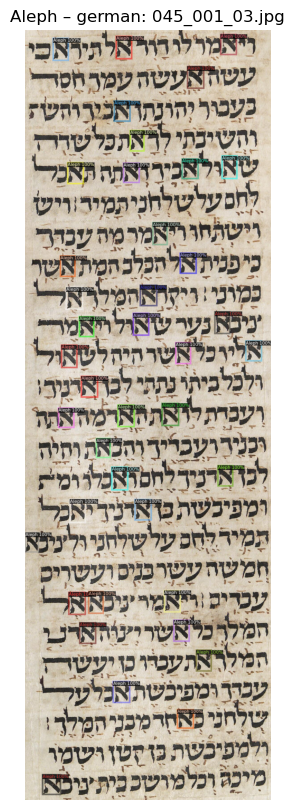

Training Detectron2 model for letter: He (category_id=2)
Output dir: detectron_letter_runs/02_He
[11/24 23:54:17 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=F

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[11/24 23:54:17 d2.engine.train_loop]: Starting training from iteration 0
[11/24 23:54:20 d2.utils.events]:  eta: 0:30:09  iter: 19  total_loss: 5.079  loss_cls: 0.7091  loss_box_reg: 0.09026  loss_rpn_cls: 3.937  loss_rpn_loc: 0.2279    time: 0.1743  last_time: 0.3262  data_time: 0.1159  last_data_time: 0.2644   lr: 4.9953e-06  max_mem: 1730M
[11/24 23:54:25 d2.utils.events]:  eta: 0:20:56  iter: 39  total_loss: 2.082  loss_cls: 0.646  loss_box_reg: 0.2071  loss_rpn_cls: 1.02  loss_rpn_loc: 0.2258    time: 0.2107  last_time: 0.0819  data_time: 0.1791  last_data_time: 0.0006   lr: 9.9902e-06  max_mem: 1927M
[11/24 23:54:29 d2.utils.events]:  eta: 0:21:11  iter: 59  total_loss: 1.431  loss_cls: 0.5747  loss_box_reg: 0.2703  loss_rpn_cls: 0.3745  loss_rpn_loc: 0.1902    time: 0.2089  last_time: 0.1409  data_time: 0.1430  last_data_time: 0.0902   lr: 1.4985e-05  max_mem: 1937M
[11/24 23:54:35 d2.utils.events]:  eta: 0:28:13  iter: 79  total_loss: 1.418  loss_cls: 0.5356  loss_box_reg: 0.4

/home/suliman/miniconda3/envs/measure_ratios/lib/python3.12/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f,


[He] french: found 144 images under images/french


He – french: 100%|██████████| 144/144 [00:26<00:00,  5.42it/s]


Saved 3912 predictions for 144 images (french, He, category_id=2) -> detectron_preds/detectron_preds_cat2_french.json

[He] german: found 156 images under images/german


He – german: 100%|██████████| 156/156 [00:31<00:00,  5.00it/s]


Saved 5005 predictions for 156 images (german, He, category_id=2) -> detectron_preds/detectron_preds_cat2_german.json


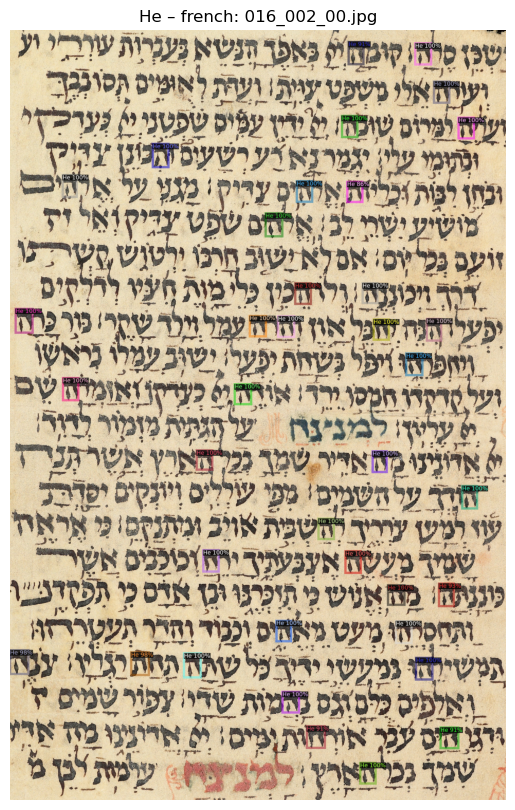

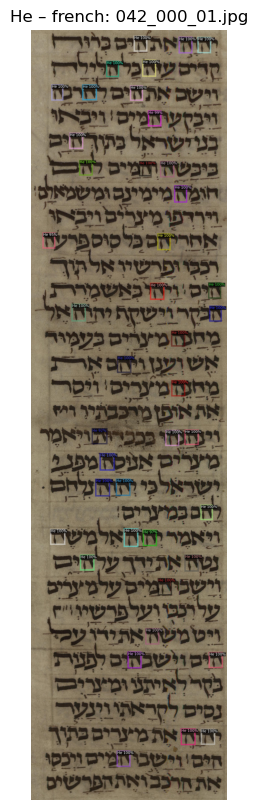

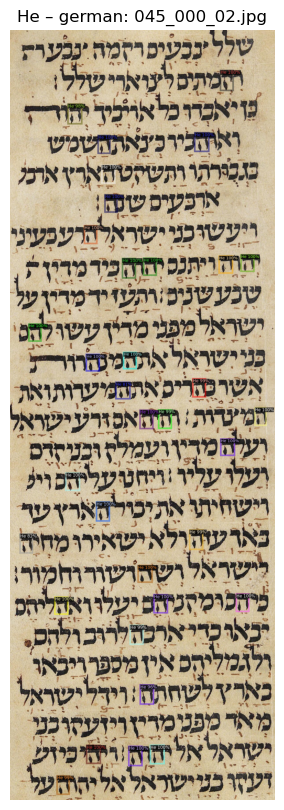

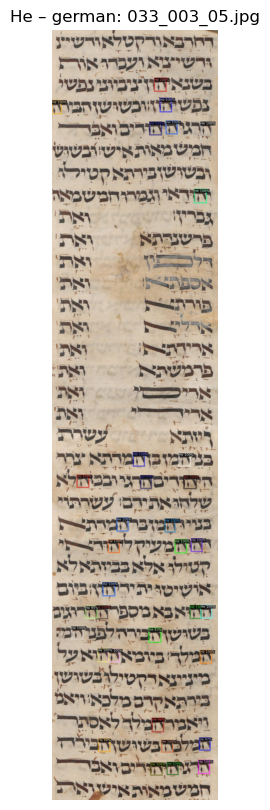

Training Detectron2 model for letter: Mem (category_id=3)
Output dir: detectron_letter_runs/03_Mem
[11/25 00:44:45 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[11/25 00:44:45 d2.engine.train_loop]: Starting training from iteration 0
[11/25 00:44:50 d2.utils.events]:  eta: 0:18:49  iter: 19  total_loss: 3.733  loss_cls: 0.6251  loss_box_reg: 0.2429  loss_rpn_cls: 2.656  loss_rpn_loc: 0.2282    time: 0.2306  last_time: 0.8226  data_time: 0.1673  last_data_time: 0.7400   lr: 4.9953e-06  max_mem: 1938M
[11/25 00:44:53 d2.utils.events]:  eta: 0:22:24  iter: 39  total_loss: 1.796  loss_cls: 0.5639  loss_box_reg: 0.2533  loss_rpn_cls: 0.9331  loss_rpn_loc: 0.1906    time: 0.2095  last_time: 0.2438  data_time: 0.1267  last_data_time: 0.1881   lr: 9.9902e-06  max_mem: 1938M
[11/25 00:44:58 d2.utils.events]:  eta: 0:22:22  iter: 59  total_loss: 1.218  loss_cls: 0.4993  loss_box_reg: 0.2734  loss_rpn_cls: 0.2567  loss_rpn_loc: 0.1492    time: 0.2078  last_time: 0.8192  data_time: 0.1425  last_data_time: 0.7490   lr: 1.4985e-05  max_mem: 1938M
[11/25 00:45:01 d2.utils.events]:  eta: 0:22:20  iter: 79  total_loss: 1.3  loss_cls: 0.4912  loss_box_reg: 0.4

/home/suliman/miniconda3/envs/measure_ratios/lib/python3.12/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f,


[Mem] french: found 144 images under images/french


Mem – french: 100%|██████████| 144/144 [00:26<00:00,  5.38it/s]


Saved 3749 predictions for 144 images (french, Mem, category_id=3) -> detectron_preds/detectron_preds_cat3_french.json

[Mem] german: found 156 images under images/german


Mem – german: 100%|██████████| 156/156 [00:31<00:00,  5.02it/s]


Saved 4158 predictions for 156 images (german, Mem, category_id=3) -> detectron_preds/detectron_preds_cat3_german.json


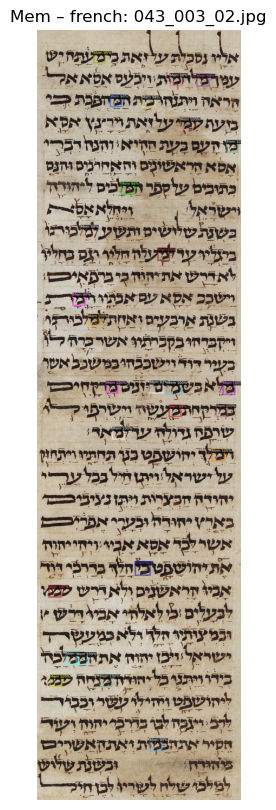

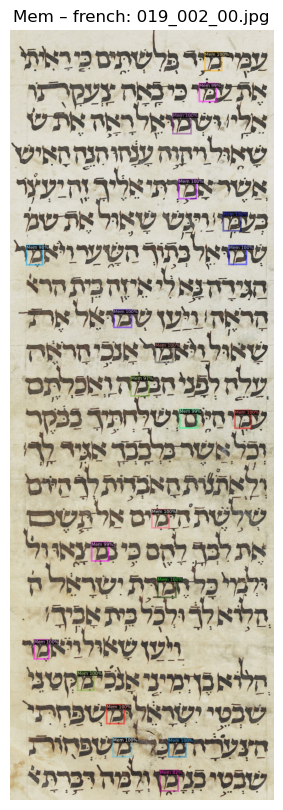

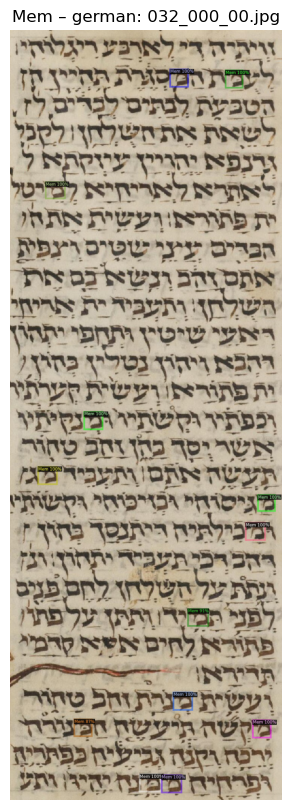

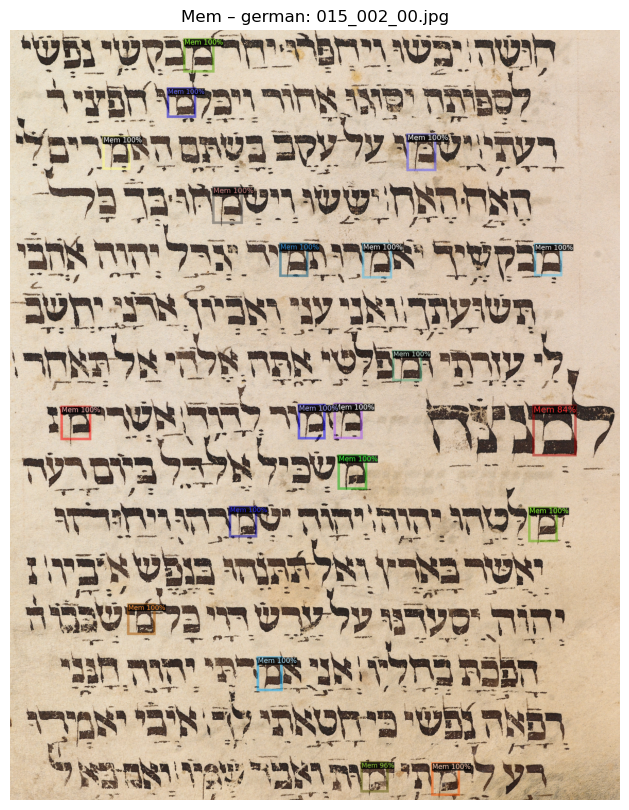

Training Detectron2 model for letter: Shin (category_id=4)
Output dir: detectron_letter_runs/04_Shin
[11/25 01:31:31 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bi

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[11/25 01:31:31 d2.engine.train_loop]: Starting training from iteration 0
[11/25 01:31:35 d2.utils.events]:  eta: 0:21:34  iter: 19  total_loss: 3.004  loss_cls: 0.6796  loss_box_reg: 0.08706  loss_rpn_cls: 2.119  loss_rpn_loc: 0.114    time: 0.2025  last_time: 0.2754  data_time: 0.1316  last_data_time: 0.2112   lr: 4.9953e-06  max_mem: 2096M
[11/25 01:31:39 d2.utils.events]:  eta: 0:23:09  iter: 39  total_loss: 1.512  loss_cls: 0.6044  loss_box_reg: 0.2544  loss_rpn_cls: 0.5496  loss_rpn_loc: 0.1118    time: 0.2026  last_time: 0.5863  data_time: 0.1387  last_data_time: 0.5116   lr: 9.9902e-06  max_mem: 2097M
[11/25 01:31:42 d2.utils.events]:  eta: 0:21:57  iter: 59  total_loss: 1.273  loss_cls: 0.5614  loss_box_reg: 0.3669  loss_rpn_cls: 0.1225  loss_rpn_loc: 0.1099    time: 0.1895  last_time: 0.6840  data_time: 0.1049  last_data_time: 0.6081   lr: 1.4985e-05  max_mem: 2097M
[11/25 01:31:46 d2.utils.events]:  eta: 0:21:09  iter: 79  total_loss: 1.223  loss_cls: 0.517  loss_box_reg: 0.

/home/suliman/miniconda3/envs/measure_ratios/lib/python3.12/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f,


[Shin] french: found 144 images under images/french


Shin – french: 100%|██████████| 144/144 [00:26<00:00,  5.45it/s]


Saved 3806 predictions for 144 images (french, Shin, category_id=4) -> detectron_preds/detectron_preds_cat4_french.json

[Shin] german: found 156 images under images/german


Shin – german: 100%|██████████| 156/156 [00:30<00:00,  5.08it/s]


Saved 3730 predictions for 156 images (german, Shin, category_id=4) -> detectron_preds/detectron_preds_cat4_german.json


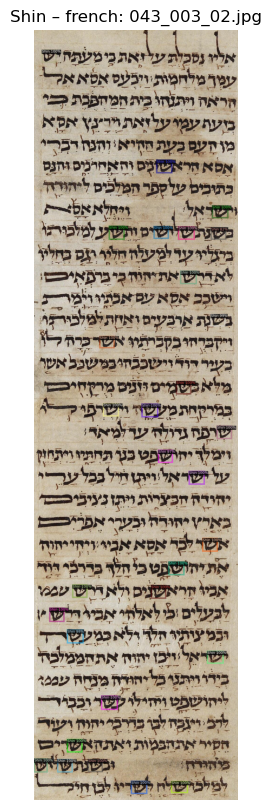

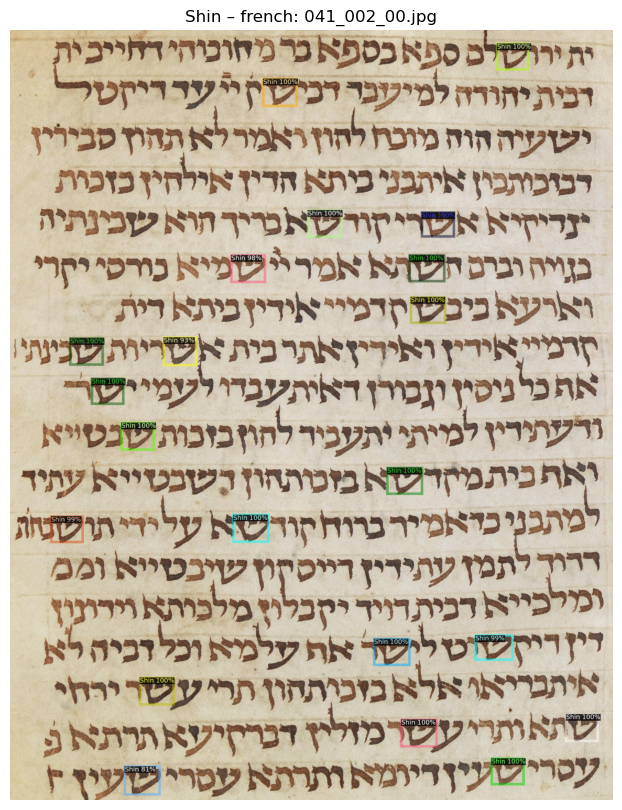

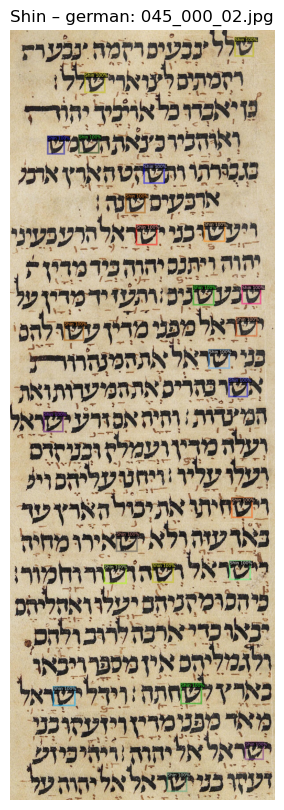

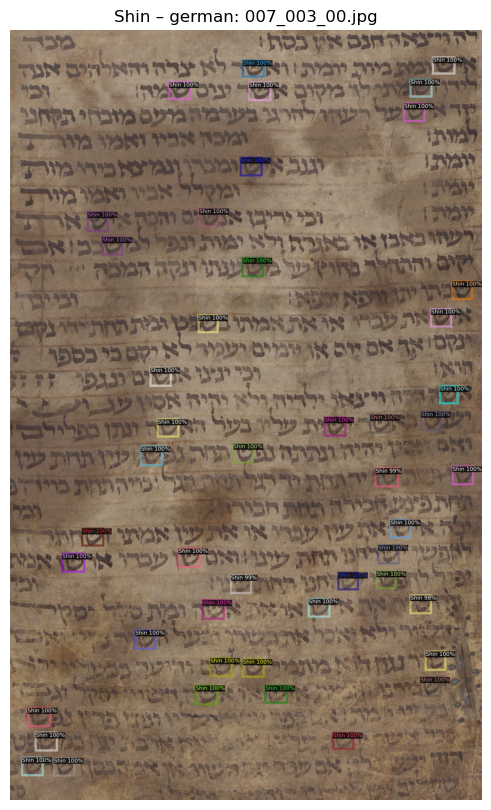

Training Detectron2 model for letter: Mem Sofit (category_id=5)
Output dir: detectron_letter_runs/05_Mem Sofit
[11/25 02:18:56 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[11/25 02:18:56 d2.engine.train_loop]: Starting training from iteration 0
[11/25 02:19:00 d2.utils.events]:  eta: 0:21:25  iter: 19  total_loss: 1.964  loss_cls: 0.7107  loss_box_reg: 0.07148  loss_rpn_cls: 1.111  loss_rpn_loc: 0.07271    time: 0.2218  last_time: 0.3563  data_time: 0.1613  last_data_time: 0.2785   lr: 4.9953e-06  max_mem: 2197M
[11/25 02:19:03 d2.utils.events]:  eta: 0:20:04  iter: 39  total_loss: 1.063  loss_cls: 0.5936  loss_box_reg: 0.06235  loss_rpn_cls: 0.3935  loss_rpn_loc: 0.05551    time: 0.1810  last_time: 0.3489  data_time: 0.0843  last_data_time: 0.2862   lr: 9.9902e-06  max_mem: 2198M
[11/25 02:19:07 d2.utils.events]:  eta: 0:20:45  iter: 59  total_loss: 0.8896  loss_cls: 0.4396  loss_box_reg: 0.09637  loss_rpn_cls: 0.3069  loss_rpn_loc: 0.05434    time: 0.1851  last_time: 0.0579  data_time: 0.1324  last_data_time: 0.0006   lr: 1.4985e-05  max_mem: 2198M
[11/25 02:19:11 d2.utils.events]:  eta: 0:21:45  iter: 79  total_loss: 0.7278  loss_cls: 0.3655  loss_bo

/home/suliman/miniconda3/envs/measure_ratios/lib/python3.12/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f,


[Mem Sofit] french: found 144 images under images/french


Mem Sofit – french: 100%|██████████| 144/144 [00:26<00:00,  5.40it/s]


Saved 1749 predictions for 144 images (french, Mem Sofit, category_id=5) -> detectron_preds/detectron_preds_cat5_french.json

[Mem Sofit] german: found 156 images under images/german


Mem Sofit – german: 100%|██████████| 156/156 [00:30<00:00,  5.08it/s]


Saved 1718 predictions for 156 images (german, Mem Sofit, category_id=5) -> detectron_preds/detectron_preds_cat5_german.json


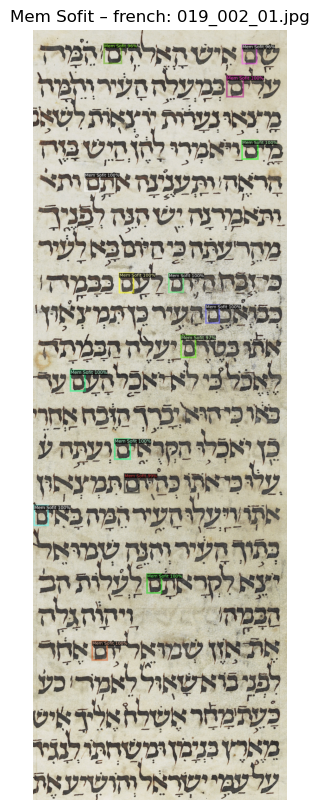

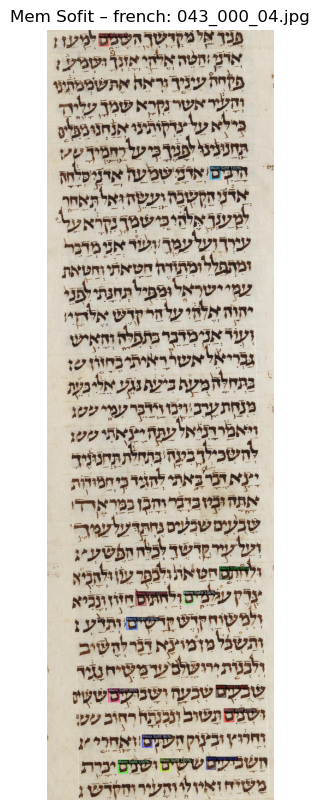

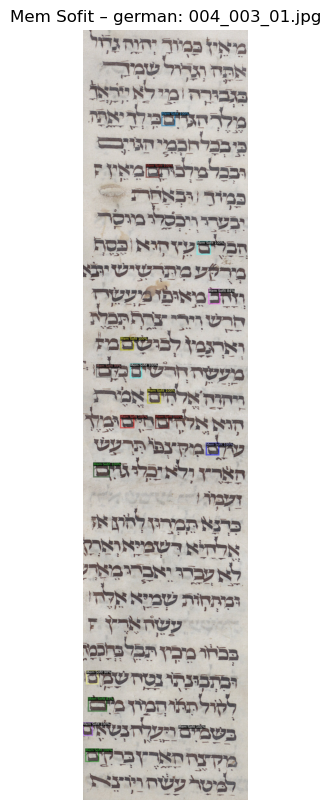

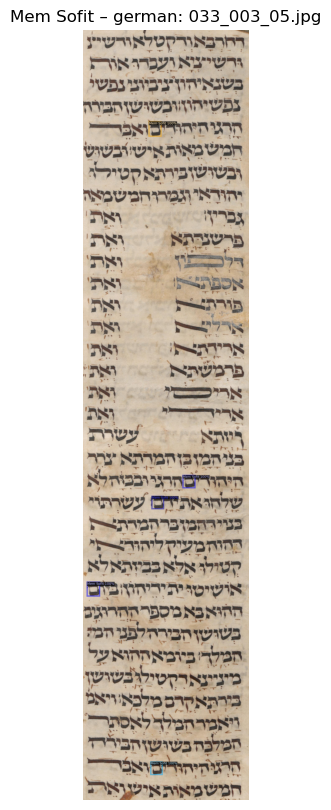

Training Detectron2 model for letter: Tav (category_id=6)
Output dir: detectron_letter_runs/06_Tav
[11/25 03:05:39 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (2, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (2,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (4, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (4,) in the model! You might want to double check if this is expected.
Some model parameters or buffers are not found in the checkpoint:
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, we

[11/25 03:05:39 d2.engine.train_loop]: Starting training from iteration 0
[11/25 03:05:43 d2.utils.events]:  eta: 0:20:37  iter: 19  total_loss: 4.7  loss_cls: 0.8364  loss_box_reg: 0.1  loss_rpn_cls: 3.594  loss_rpn_loc: 0.2616    time: 0.2039  last_time: 0.0853  data_time: 0.1470  last_data_time: 0.0017   lr: 4.9953e-06  max_mem: 2236M
[11/25 03:05:47 d2.utils.events]:  eta: 0:20:35  iter: 39  total_loss: 1.859  loss_cls: 0.693  loss_box_reg: 0.1932  loss_rpn_cls: 0.7895  loss_rpn_loc: 0.2013    time: 0.1850  last_time: 0.6188  data_time: 0.1037  last_data_time: 0.5341   lr: 9.9902e-06  max_mem: 2292M
[11/25 03:05:50 d2.utils.events]:  eta: 0:21:53  iter: 59  total_loss: 1.588  loss_cls: 0.5872  loss_box_reg: 0.2616  loss_rpn_cls: 0.488  loss_rpn_loc: 0.2214    time: 0.1796  last_time: 0.0841  data_time: 0.1054  last_data_time: 0.0278   lr: 1.4985e-05  max_mem: 2293M
[11/25 03:05:55 d2.utils.events]:  eta: 0:22:29  iter: 79  total_loss: 1.382  loss_cls: 0.5183  loss_box_reg: 0.2836  

/home/suliman/miniconda3/envs/measure_ratios/lib/python3.12/site-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f,


[Tav] french: found 144 images under images/french


Tav – french: 100%|██████████| 144/144 [00:26<00:00,  5.50it/s]


Saved 2665 predictions for 144 images (french, Tav, category_id=6) -> detectron_preds/detectron_preds_cat6_french.json

[Tav] german: found 156 images under images/german


Tav – german: 100%|██████████| 156/156 [00:30<00:00,  5.14it/s]


Saved 3985 predictions for 156 images (german, Tav, category_id=6) -> detectron_preds/detectron_preds_cat6_german.json


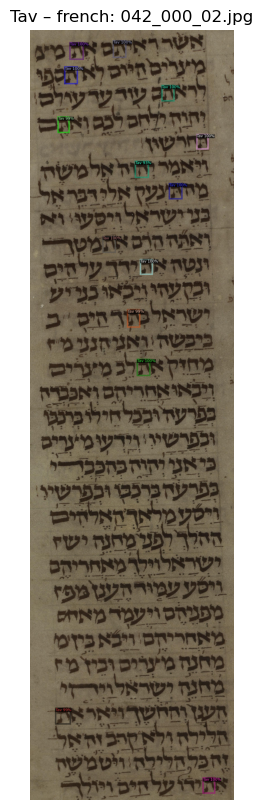

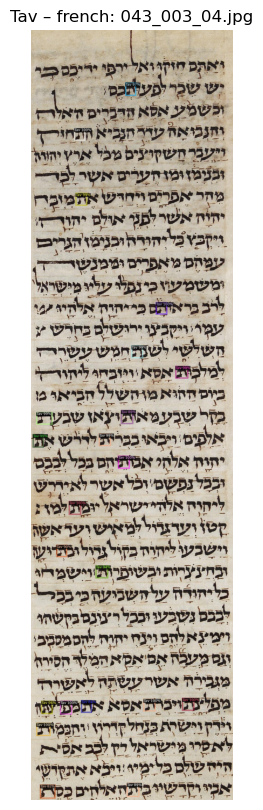

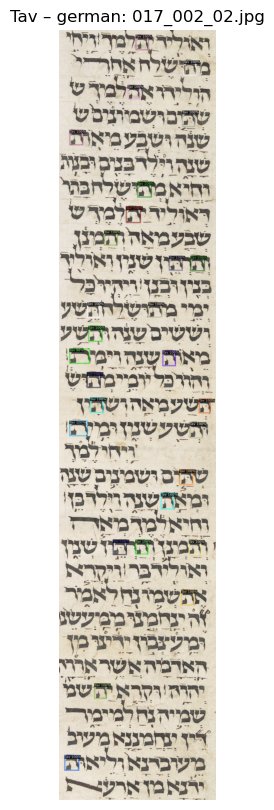

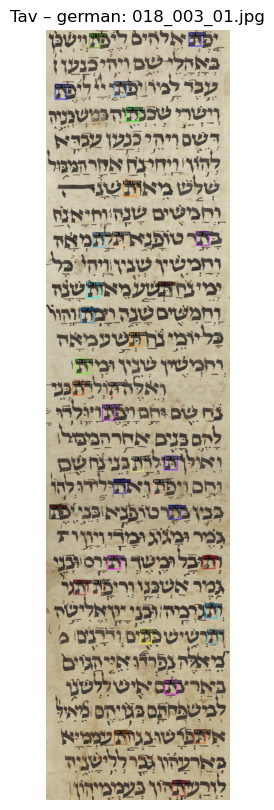

In [10]:
# Cell: main loop – train & export for all letters, one at a time

letter_runs = {}  # store info if you want to summarise metrics later

for L in LETTERS:
    category_id = L["category_id"]
    letter_name = L["letter_name"]

    # Ensure datasets are registered
    register_letter_datasets(letter_name, category_id)

    # Train & eval
    run_info = train_and_eval_letter(letter_name, category_id)
    letter_runs[category_id] = run_info

    predictor = run_info["predictor"]

    # Export predictions for both script modes (french/german) with the
    # same JSON filename pattern as in the original Aleph notebook.
    for script_mode in SCRIPT_MODES:
        export_detectron_predictions_for_letter_and_script(
            letter_name=letter_name,
            category_id=category_id,
            predictor=predictor,
            script_mode=script_mode,
        )

    # (Optional) Visualization for thesis
    visualize_predictions_for_letter(letter_name, predictor, "french", n=2)
    visualize_predictions_for_letter(letter_name, predictor, "german", n=2)

📊 Code cell: build table of mAP / recall per letter

In [11]:
# Cell: build a per-letter table of COCO metrics (mAPs + recalls)

import pandas as pd
import math

rows = []

for L in LETTERS:
    cid = L["category_id"]
    lname = L["letter_name"]

    run_info = letter_runs.get(cid)
    if run_info is None:
        print(f"Warning: no run_info found for category_id={cid}, letter={lname}")
        continue

    results = run_info.get("results", {})
    bbox = results.get("bbox", {})

    row = {
        "category_id": cid,
        "letter": lname,
        "AP":   bbox.get("AP", math.nan),
        "AP50": bbox.get("AP50", math.nan),
        "AP75": bbox.get("AP75", math.nan),
        "APs":  bbox.get("APs", math.nan),
        "APm":  bbox.get("APm", math.nan),
        "APl":  bbox.get("APl", math.nan),
    } 

    rows.append(row)

metrics_df = pd.DataFrame(rows).sort_values("category_id").reset_index(drop=True)
display(metrics_df)

# Optional: export for thesis use
print("\nMarkdown table (nice for notes / GitHub):\n")
print(metrics_df.to_markdown(index=False, floatfmt=".3f"))

print("\nLaTeX table (paste into thesis):\n")
print(
    metrics_df.to_latex(
        index=False,
        float_format="%.3f",
        column_format="r l r r r r r r",  # adjust as you like
        caption="Detection performance per letter (Detectron2, COCO metrics).",
        label="tab:detectron_letter_metrics",
    )
)

,category_id,letter,AP,AP50,AP75,APs,APm,APl
0,1,Aleph,63.103311,86.869818,78.573652,NaN,66.396505,58.720307
1,2,He,51.088006,67.762064,64.425497,NaN,48.987143,65.460822
2,3,Mem,66.562264,88.130699,85.229839,NaN,64.235028,76.007530
3,4,Shin,69.553026,87.832710,86.448302,NaN,75.887663,65.757585
4,5,Mem Sofit,62.295140,83.382758,83.256494,NaN,61.708386,75.000559
5,6,Tav,54.007781,71.446863,69.735484,NaN,51.247038,66.547530



Markdown table (nice for notes / GitHub):

|   category_id | letter    |     AP |   AP50 |   AP75 |   APs |    APm |    APl |
|--------------:|:----------|-------:|-------:|-------:|------:|-------:|-------:|
|             1 | Aleph     | 63.103 | 86.870 | 78.574 |   nan | 66.397 | 58.720 |
|             2 | He        | 51.088 | 67.762 | 64.425 |   nan | 48.987 | 65.461 |
|             3 | Mem       | 66.562 | 88.131 | 85.230 |   nan | 64.235 | 76.008 |
|             4 | Shin      | 69.553 | 87.833 | 86.448 |   nan | 75.888 | 65.758 |
|             5 | Mem Sofit | 62.295 | 83.383 | 83.256 |   nan | 61.708 | 75.001 |
|             6 | Tav       | 54.008 | 71.447 | 69.735 |   nan | 51.247 | 66.548 |

LaTeX table (paste into thesis):

\begin{table}
\caption{Detection performance per letter (Detectron2, COCO metrics).}
\label{tab:detectron_letter_metrics}
\begin{tabular}{r l r r r r r r}
\toprule
category_id & letter & AP & AP50 & AP75 & APs & APm & APl \\
\midrule
1 & Aleph & 63.103 & 86